Task: Visulization

CSV Files: Fat_Supply_Quantity_Data, Protein_Supply_Quantity_Data, Food_Supply_kcal_Data.csv, Food_Supply_Quantity_kg_Data.csv

In [150]:
#import libraries
import pandas as pd
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
from pandas.plotting import radviz

In [151]:
# COLUMN ORGANIZATION
HELTH_POP = ['Obesity', 'Undernourished', 'Deaths','Recovered','Active','Confirmed', 'Population', 'Unit (all except Population)']
GENERAL_HEALTH = ['Obesity', 'Undernourished']
COVID = ['Confirmed', 'Deaths', 'Recovered', 'Active']
HEALTH_DATA = ['Country', 'Confirmed', 'Deaths', 'Recovered', 'Active', 'Obesity', 'Undernourished']

In [152]:
#Load CSV files in Panda and clean data

Fat_Supply_DF = pd.read_csv("../dash_app/data/Fat_Supply_Quantity_Data.csv").dropna()
Protein_Supply_DF = pd.read_csv("../dash_app/data/Protein_Supply_Quantity_Data.csv").dropna()
Kcal_data_DF =  pd.read_csv("../dash_app/data/Food_Supply_kcal_Data.csv").dropna()
Amount_data_DF = pd.read_csv("../dash_app/data/Food_Supply_Quantity_kg_Data.csv").dropna()

# Remove unnecarry char
Fat_Supply_DF = Fat_Supply_DF.replace(regex=r'^<2.5', value=2.5)
Protein_Supply_DF = Protein_Supply_DF.replace(regex=r'^<', value=2.5)
Kcal_data_DF = Kcal_data_DF.replace(regex=r'^<', value=2.5)
Amount_data_DF = Amount_data_DF.replace(regex=r'^<', value=2.5)


Protein_Supply_DF['Undernourished'] = pd.to_numeric(Protein_Supply_DF['Undernourished'],errors='coerce')
Fat_Supply_DF['Undernourished'] = pd.to_numeric(Fat_Supply_DF['Undernourished'],errors='coerce')
Kcal_data_DF['Undernourished'] = pd.to_numeric(Kcal_data_DF['Undernourished'],errors='coerce')
Amount_data_DF['Undernourished'] = pd.to_numeric(Amount_data_DF['Undernourished'],errors='coerce')

# Viewing Data Table

In [153]:
print("Table Shape of Fat_Supply_Quantity_Data: ", Fat_Supply_DF.shape)
print("Table Shape of Protein_Supply_Quantity_Data: ",Protein_Supply_DF.shape)
print("Table Shape of Protein_Supply_Quantity_Data: ",Kcal_data_DF.shape)
print("Table Shape of Protein_Supply_Quantity_Data: ",Amount_data_DF.shape)


Table Shape of Fat_Supply_Quantity_Data:  (153, 32)
Table Shape of Protein_Supply_Quantity_Data:  (153, 32)
Table Shape of Protein_Supply_Quantity_Data:  (153, 32)
Table Shape of Protein_Supply_Quantity_Data:  (153, 32)


In [154]:
# Show a preview of data
Fat_Supply_DF.head()

,Country,Alcoholic Beverages,Animal Products,Animal fats,"Aquatic Products, Other",Cereals - Excluding Beer,Eggs,"Fish, Seafood",Fruits - Excluding Wine,Meat,...,Vegetable Oils,Vegetables,Obesity,Undernourished,Confirmed,Deaths,Recovered,Active,Population,Unit (all except Population)
0,Afghanistan,0.0,21.6397,6.2224,0.0,8.0353,0.6859,0.0327,0.4246,6.1244,...,17.0831,0.3593,4.5,29.8,0.029370,0.000576,0.002884,0.025911,38042000.0,%
1,Albania,0.0,32.0002,3.4172,0.0,2.6734,1.6448,0.1445,0.6418,8.7428,...,9.2443,0.6503,22.3,6.2,0.035129,0.001120,0.027817,0.006193,2858000.0,%
2,Algeria,0.0,14.4175,0.8972,0.0,4.2035,1.2171,0.2008,0.5772,3.8961,...,27.3606,0.5145,26.6,3.9,0.019589,0.001403,0.010936,0.007250,43406000.0,%
3,Angola,0.0,15.3041,1.3130,0.0,6.5545,0.1539,1.4155,0.3488,11.0268,...,22.4638,0.1231,6.8,25.0,0.000223,0.000013,0.000057,0.000153,31427000.0,%
5,Argentina,0.0,30.3572,3.3076,0.0,1.3316,1.5706,0.1664,0.2091,19.2693,...,17.3147,0.1878,28.5,4.6,0.028100,0.001039,0.008899,0.018162,44939000.0,%


In [155]:
Protein_Supply_DF.head()

,Country,Alcoholic Beverages,Animal Products,Animal fats,"Aquatic Products, Other",Cereals - Excluding Beer,Eggs,"Fish, Seafood",Fruits - Excluding Wine,Meat,...,Vegetables,Miscellaneous,Obesity,Undernourished,Confirmed,Deaths,Recovered,Active,Population,Unit (all except Population)
0,Afghanistan,0.0000,9.7523,0.0277,0.0,35.9771,0.4067,0.0647,0.5824,3.1337,...,1.1370,0.0462,4.5,29.8,0.029370,0.000576,0.002884,0.025911,38042000.0,%
1,Albania,0.1840,27.7469,0.0711,0.0,14.2331,1.8069,0.6274,1.2757,7.6582,...,3.2456,0.0544,22.3,6.2,0.035129,0.001120,0.027817,0.006193,2858000.0,%
2,Algeria,0.0323,13.8360,0.0054,0.0,26.5633,1.2916,0.6350,1.1624,3.5088,...,3.1267,0.1399,26.6,3.9,0.019589,0.001403,0.010936,0.007250,43406000.0,%
3,Angola,0.6285,15.2311,0.0277,0.0,20.3882,0.1756,5.4436,1.2754,7.6248,...,0.8133,0.0924,6.8,25.0,0.000223,0.000013,0.000057,0.000153,31427000.0,%
5,Argentina,0.1704,31.9799,0.0097,0.0,13.6702,2.0593,1.0223,0.5209,21.6250,...,1.0516,0.0000,28.5,4.6,0.028100,0.001039,0.008899,0.018162,44939000.0,%


In [156]:
Kcal_data_DF.head()

,Country,Alcoholic Beverages,Animal Products,Animal fats,"Aquatic Products, Other",Cereals - Excluding Beer,Eggs,"Fish, Seafood",Fruits - Excluding Wine,Meat,...,Vegetable Oils,Vegetables,Obesity,Undernourished,Confirmed,Deaths,Recovered,Active,Population,Unit (all except Population)
0,Afghanistan,0.0000,4.7774,0.8504,0.0,37.1186,0.1501,0.0000,1.4757,1.2006,...,2.3012,0.7504,4.5,29.8,0.029370,0.000576,0.002884,0.025911,38042000.0,%
1,Albania,0.9120,16.0930,1.0591,0.0,16.2107,0.8091,0.1471,3.8982,3.8688,...,2.8244,2.7508,22.3,6.2,0.035129,0.001120,0.027817,0.006193,2858000.0,%
2,Algeria,0.0896,6.0326,0.1941,0.0,25.0112,0.4181,0.1195,3.1805,1.2543,...,5.7638,2.0457,26.6,3.9,0.019589,0.001403,0.010936,0.007250,43406000.0,%
3,Angola,1.9388,4.6927,0.2644,0.0,18.3521,0.0441,0.8372,2.3133,2.9302,...,4.2741,0.3525,6.8,25.0,0.000223,0.000013,0.000057,0.000153,31427000.0,%
5,Argentina,1.4354,14.9869,1.0650,0.0,16.7927,0.8643,0.2006,1.4663,9.4459,...,5.5410,0.8643,28.5,4.6,0.028100,0.001039,0.008899,0.018162,44939000.0,%


In [157]:
Amount_data_DF.head()

,Country,Alcoholic Beverages,Animal fats,Animal Products,"Aquatic Products, Other",Cereals - Excluding Beer,Eggs,"Fish, Seafood",Fruits - Excluding Wine,Meat,...,Vegetables,Vegetal Products,Obesity,Undernourished,Confirmed,Deaths,Recovered,Active,Population,Unit (all except Population)
0,Afghanistan,0.0014,0.1973,9.4341,0.0,24.8097,0.2099,0.0350,5.3495,1.2020,...,6.7642,40.5645,4.5,29.8,0.029370,0.000576,0.002884,0.025911,38042000.0,%
1,Albania,1.6719,0.1357,18.7684,0.0,5.7817,0.5815,0.2126,6.7861,1.8845,...,11.7753,31.2304,22.3,6.2,0.035129,0.001120,0.027817,0.006193,2858000.0,%
2,Algeria,0.2711,0.0282,9.6334,0.0,13.6816,0.5277,0.2416,6.3801,1.1305,...,11.6484,40.3651,26.6,3.9,0.019589,0.001403,0.010936,0.007250,43406000.0,%
3,Angola,5.8087,0.0560,4.9278,0.0,9.1085,0.0587,1.7707,6.0005,2.0571,...,2.3041,45.0722,6.8,25.0,0.000223,0.000013,0.000057,0.000153,31427000.0,%
5,Argentina,4.2672,0.2234,19.3454,0.0,8.4102,0.9979,0.4693,6.0435,7.0421,...,4.3503,30.6559,28.5,4.6,0.028100,0.001039,0.008899,0.018162,44939000.0,%


### Scatter Matrix Protein Data

Text(0.5, 0.11, 'Protein Supply scatter scatter matrix')

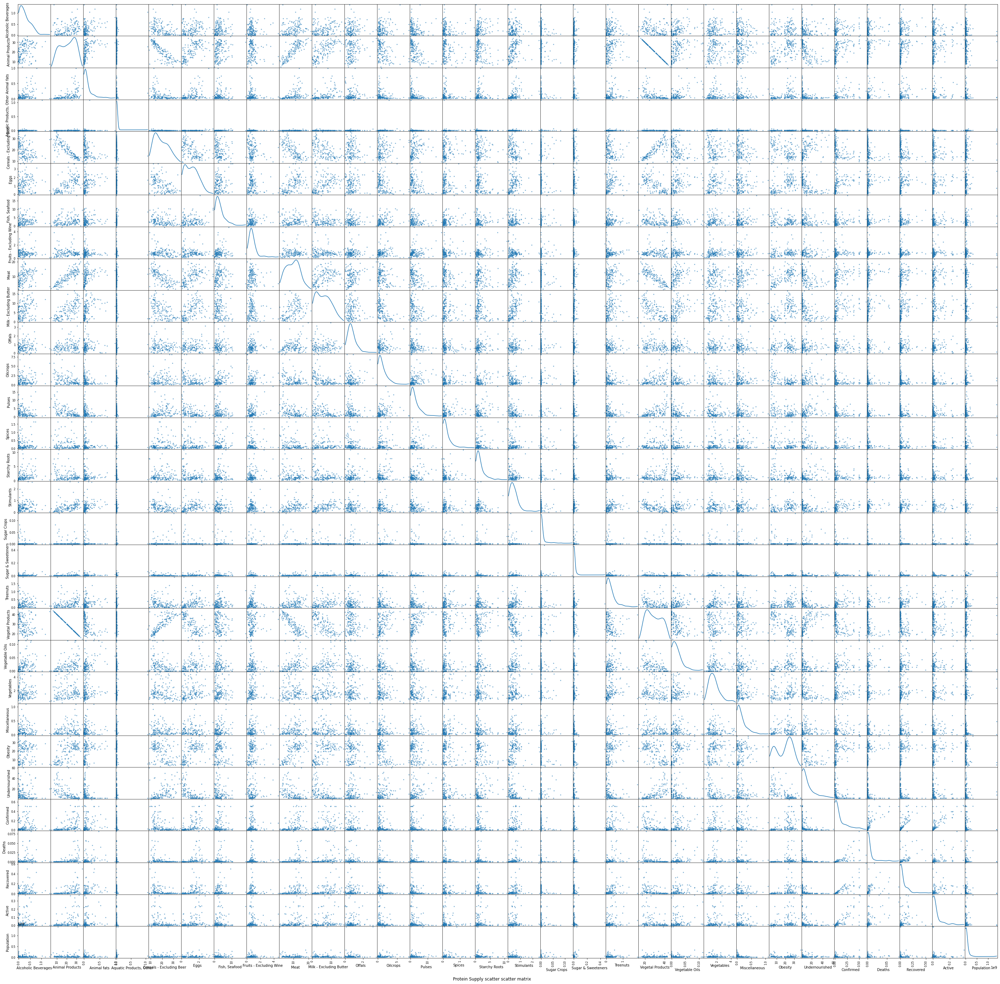

In [158]:
scatter_matrix(Protein_Supply_DF, alpha=0.6, figsize=(50, 50), diagonal='kde')
plt.suptitle('Protein Supply scatter scatter matrix', y=0.11 )


### Scatter Matrix Fat Data

Text(0.5, 0.11, 'Fat Supply scatter scatter matrix')

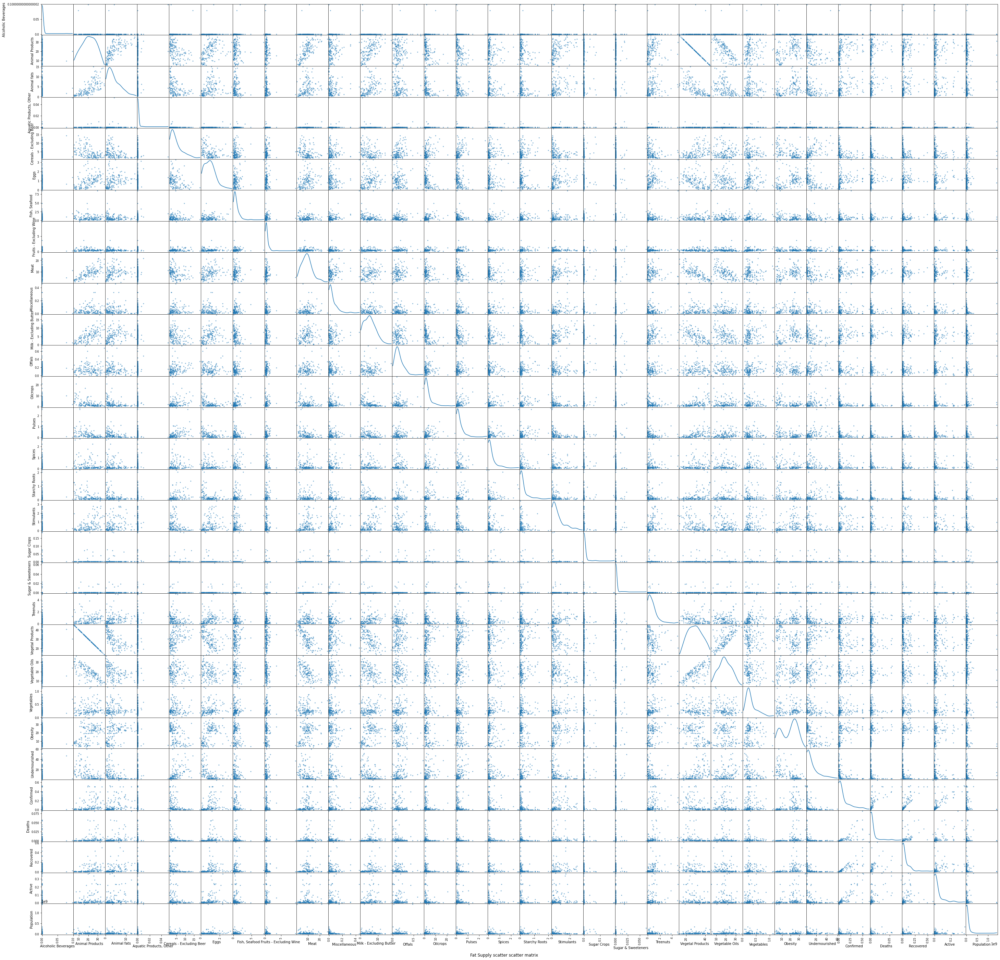

In [159]:
scatter_matrix(Fat_Supply_DF, alpha=0.6, figsize=(50, 50), diagonal='kde')
plt.suptitle('Fat Supply scatter scatter matrix', y=0.11)


### Scatter Matrix Kcal Data

Text(0.5, 0.11, 'Kcal data scatter scatter matrix')

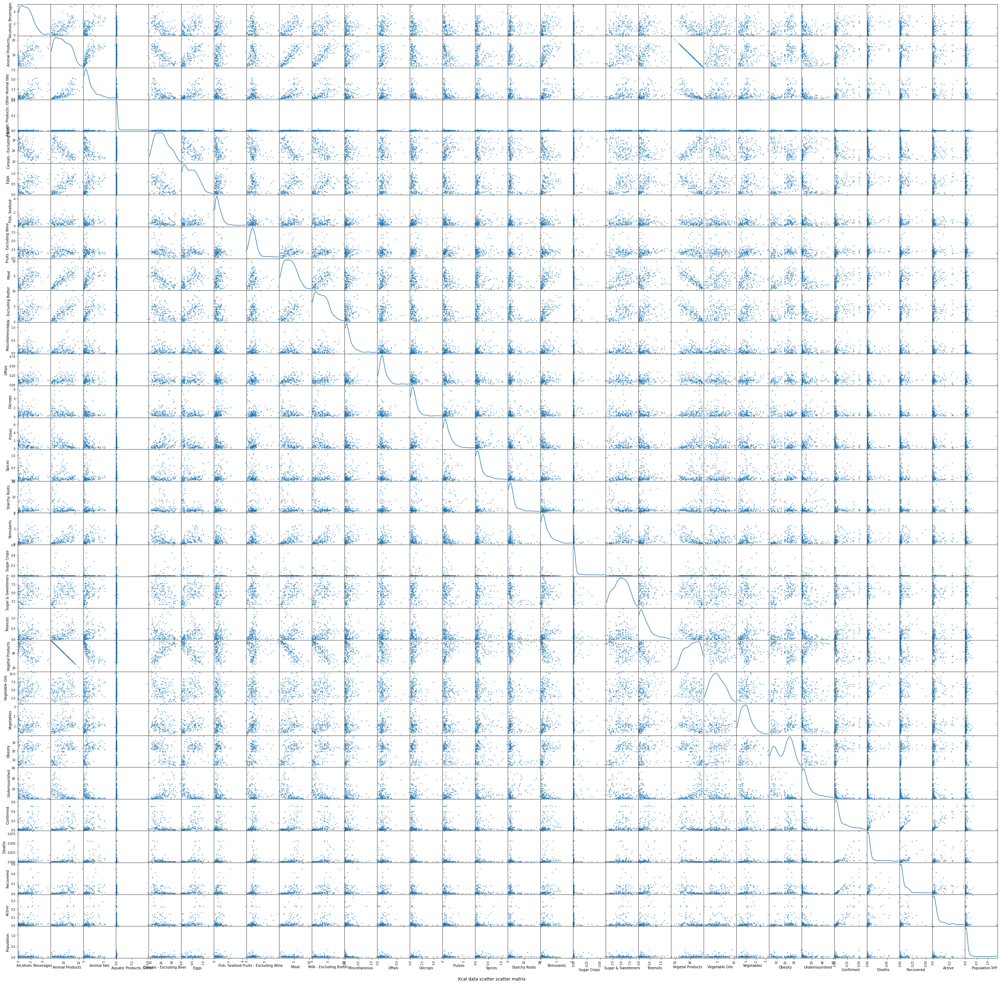

In [160]:
scatter_matrix(Kcal_data_DF, alpha=0.6, figsize=(50, 50), diagonal='kde')
plt.suptitle('Kcal data scatter scatter matrix', y=0.11)

### Scatter Matrix Amount Data

Text(0.5, 0.11, 'Food consumption data scatter scatter matrix')

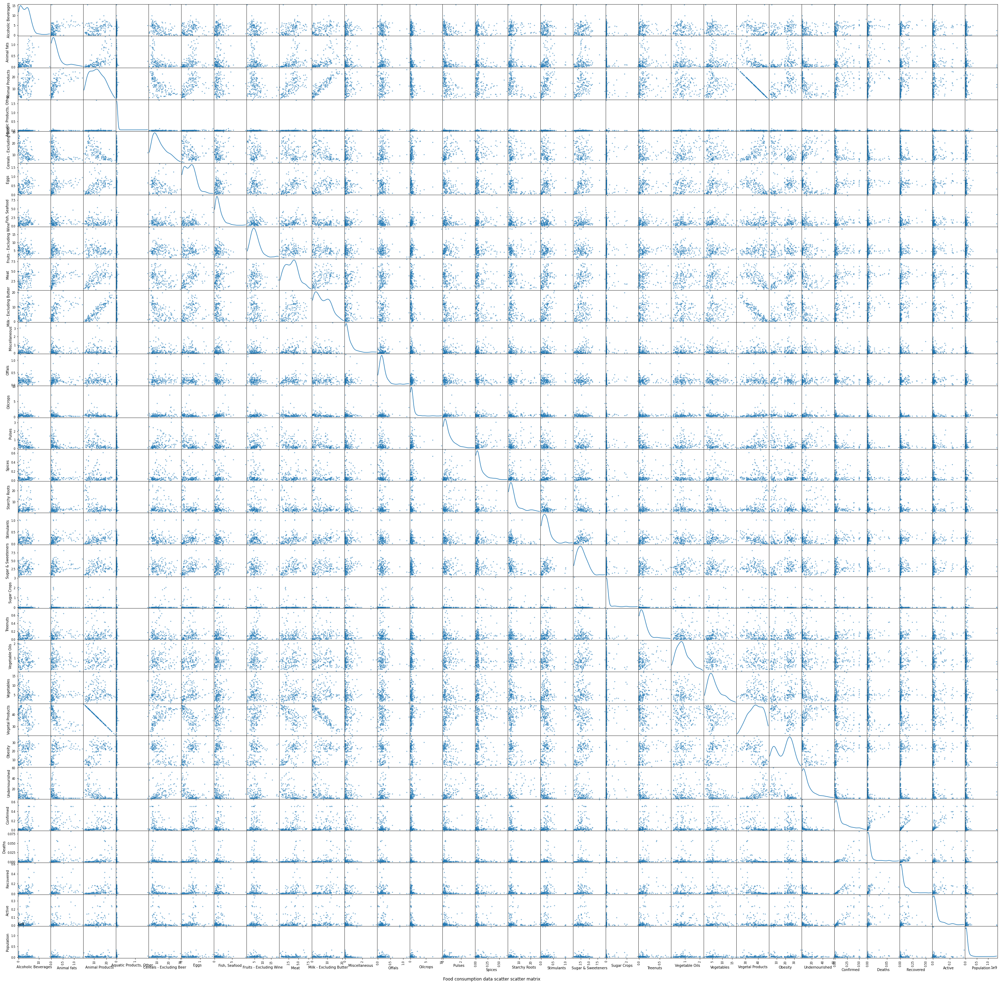

In [161]:
scatter_matrix(Amount_data_DF, alpha=0.6, figsize=(50, 50), diagonal='kde')
plt.suptitle('Food consumption data scatter scatter matrix', y=0.11)

### Common data on all dataset ( Covid 19 INFO)

Text(0.5, 0.05, 'Countries that has high infection rate')

<Figure size 432x288 with 0 Axes>

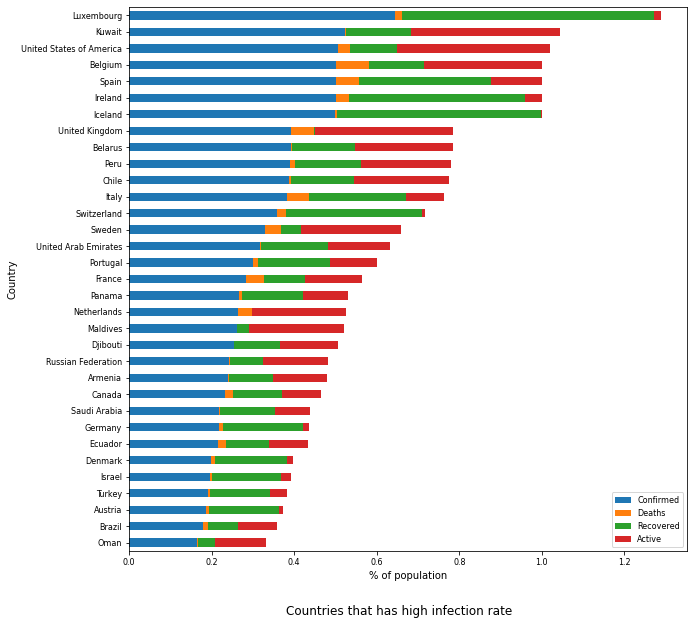

In [162]:
df = Fat_Supply_DF[['Country','Confirmed', 'Deaths', 'Recovered', 'Active']].sort_values(by="Confirmed",ascending = True ).dropna(axis=0) #.drop(["Country","Population", "Unit (all except Population)"], axis =1)
df.dropna()
df = df[120:]
plt.figure();
df.plot.barh(stacked=True,figsize=(10,10), x = 'Country',fontsize = 8).legend(fontsize=8)
plt.xlabel('% of population')
plt.suptitle("Countries that has high infection rate",y=0.05)



In [163]:
#Ideantify columMs 
ALL_COLUMNS =list(Protein_Supply_DF.columns)
print(ALL_COLUMNS)

['Country', 'Alcoholic Beverages', 'Animal Products', 'Animal fats', 'Aquatic Products, Other', 'Cereals - Excluding Beer', 'Eggs', 'Fish, Seafood', 'Fruits - Excluding Wine', 'Meat', 'Milk - Excluding Butter', 'Offals', 'Oilcrops', 'Pulses', 'Spices', 'Starchy Roots', 'Stimulants', 'Sugar Crops', 'Sugar & Sweeteners', 'Treenuts', 'Vegetal Products', 'Vegetable Oils', 'Vegetables', 'Miscellaneous', 'Obesity', 'Undernourished', 'Confirmed', 'Deaths', 'Recovered', 'Active', 'Population', 'Unit (all except Population)']


In [164]:
ALL_FOOD_COLUMNS = ['Country', 'Alcoholic Beverages', 'Animal Products', 'Animal fats',
       'Aquatic Products, Other', 'Cereals - Excluding Beer', 'Eggs',
       'Fish, Seafood', 'Fruits - Excluding Wine', 'Meat',
       'Milk - Excluding Butter', 'Offals', 'Oilcrops', 'Pulses', 'Spices',
       'Starchy Roots', 'Stimulants', 'Sugar Crops', 'Sugar & Sweeteners',
       'Treenuts', 'Vegetal Products', 'Vegetable Oils', 'Vegetables',
       'Miscellaneous']

In [165]:
Protein_df = Protein_Supply_DF[ALL_FOOD_COLUMNS].dropna()


In [166]:
Fat_df = Fat_Supply_DF[ALL_FOOD_COLUMNS].dropna()


In [167]:
Kcal_df = Kcal_data_DF[ALL_FOOD_COLUMNS].dropna()


In [168]:
Amount_df = Amount_data_DF[ALL_FOOD_COLUMNS].dropna()


## Corona cases

In [169]:
Corona_case_df = Protein_Supply_DF[['Confirmed', 'Deaths',
       'Recovered', 'Active']].dropna()
print("Covid-19 cases' percentage: ")
Corona_case_df.head()

Covid-19 cases' percentage: 


,Confirmed,Deaths,Recovered,Active
0,0.029370,0.000576,0.002884,0.025911
1,0.035129,0.001120,0.027817,0.006193
2,0.019589,0.001403,0.010936,0.007250
3,0.000223,0.000013,0.000057,0.000153
5,0.028100,0.001039,0.008899,0.018162


## General Health 

In [170]:
General_Health_Condition_df = Protein_Supply_DF[['Obesity', 'Undernourished', ]].dropna()
print("General health condition ('Obesity', 'Undernourished') percentage: ")
General_Health_Condition_df.head()


General health condition ('Obesity', 'Undernourished') percentage: 


,Obesity,Undernourished
0,4.5,29.8
1,22.3,6.2
2,26.6,3.9
3,6.8,25.0
5,28.5,4.6


### Box plot of Fat Consumtion Data

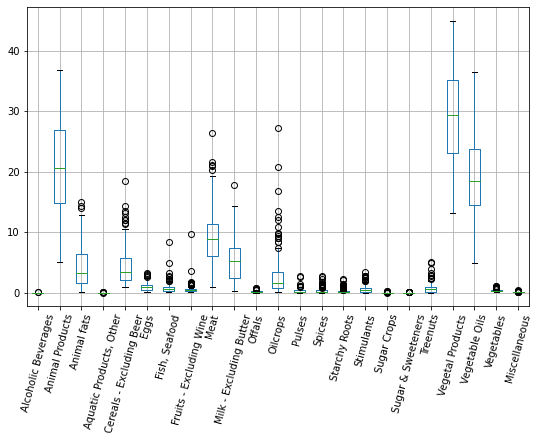

In [171]:
Fat_df.boxplot(figsize=(9,5.5),rot =75)

### Box plot of Protein consumption

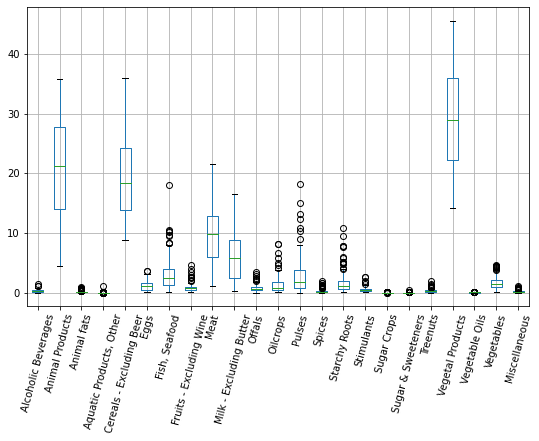

In [172]:
Protein_df.drop(['Country'], axis=1).boxplot(figsize=(9,5.5),rot =75)

# Box plot of Energy consumption Data

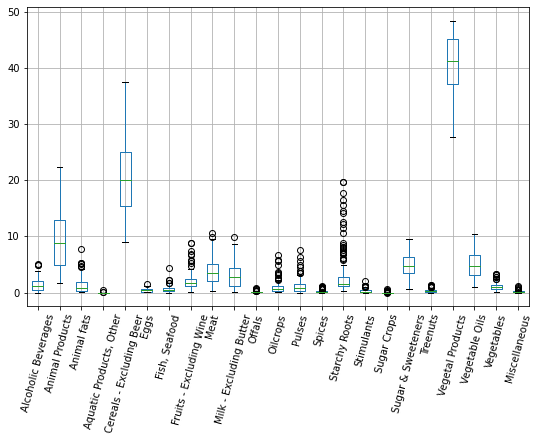

In [173]:
Kcal_df.drop(['Country'], axis=1).boxplot(figsize=(9,5.5),rot =75)

# Box plot for food amount data

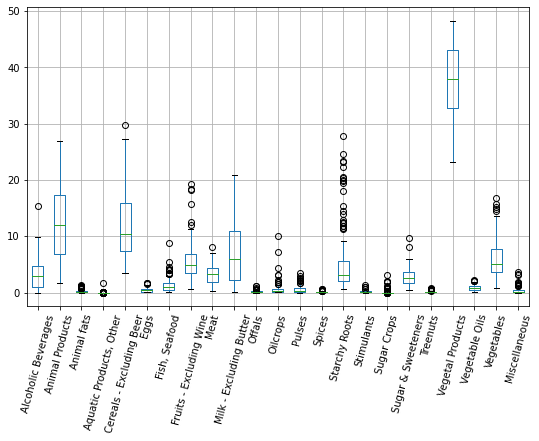

In [174]:
Amount_df.drop(['Country'], axis=1).boxplot(figsize=(9,5.5),rot =75)

### Box plot of corona infection

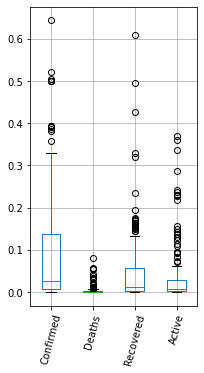

In [175]:
Corona_case_df.boxplot(figsize=(3,5.5),rot =75)

### Box plot of general health condition

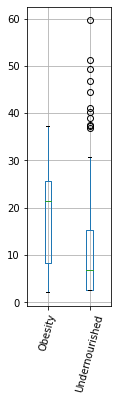

In [176]:
#General_Health_Condition_df.applymap(str)
General_Health_Condition_df.boxplot(figsize=(1.5,5.5),rot =75)

### Scatter plot of Corona_case vs General_Health_Condition


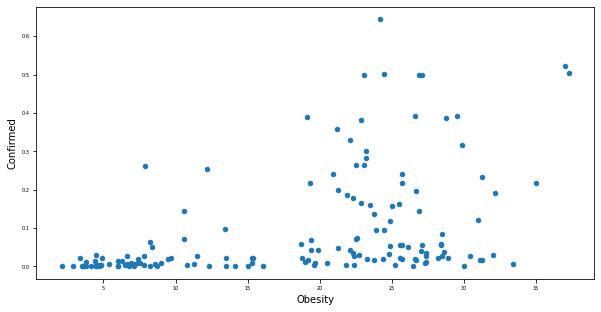

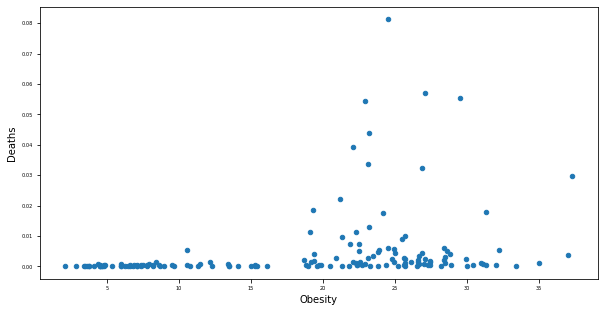

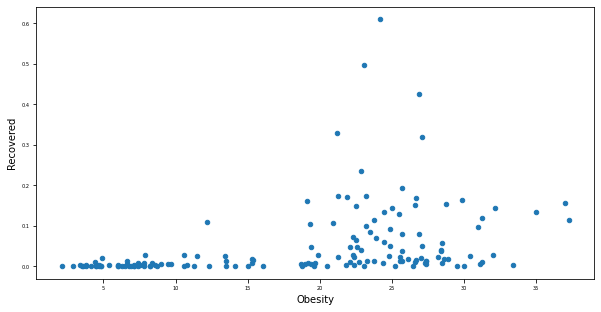

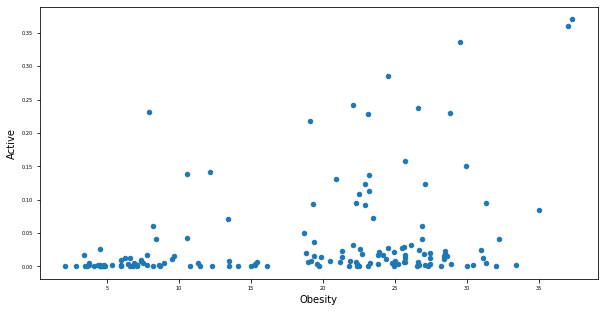

In [177]:
plots_Obesity_vs_Covid_indection = [Protein_Supply_DF.plot.scatter(x='Obesity', figsize=(10,5), y=col,fontsize = 5 ) for col in Corona_case_df.columns]


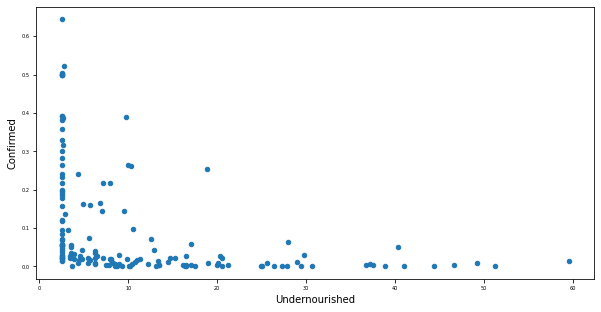

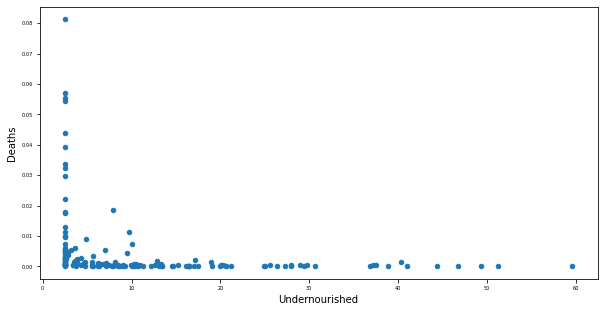

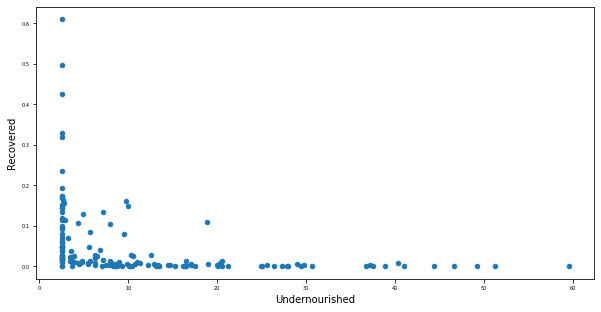

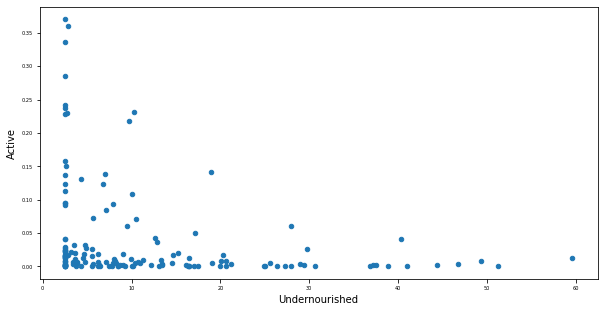

In [178]:
plots_Undernourished_vs_Covid_indection = [Protein_Supply_DF.plot.scatter(x='Undernourished', figsize=(10,5), y=col,fontsize = 5 ) for col in Corona_case_df.columns]


### Visualization of muli-variate data for some countries (Fat consumption from different kinds of raw food )

In [179]:
SAMPLE_COLUMNS = ['Country', 'Animal Products', 'Miscellaneous','Animal fats','Milk - Excluding Butter','Cereals - Excluding Beer','Meat','Fish, Seafood', 'Meat','Treenuts', 'Vegetal Products', 'Vegetable Oils']

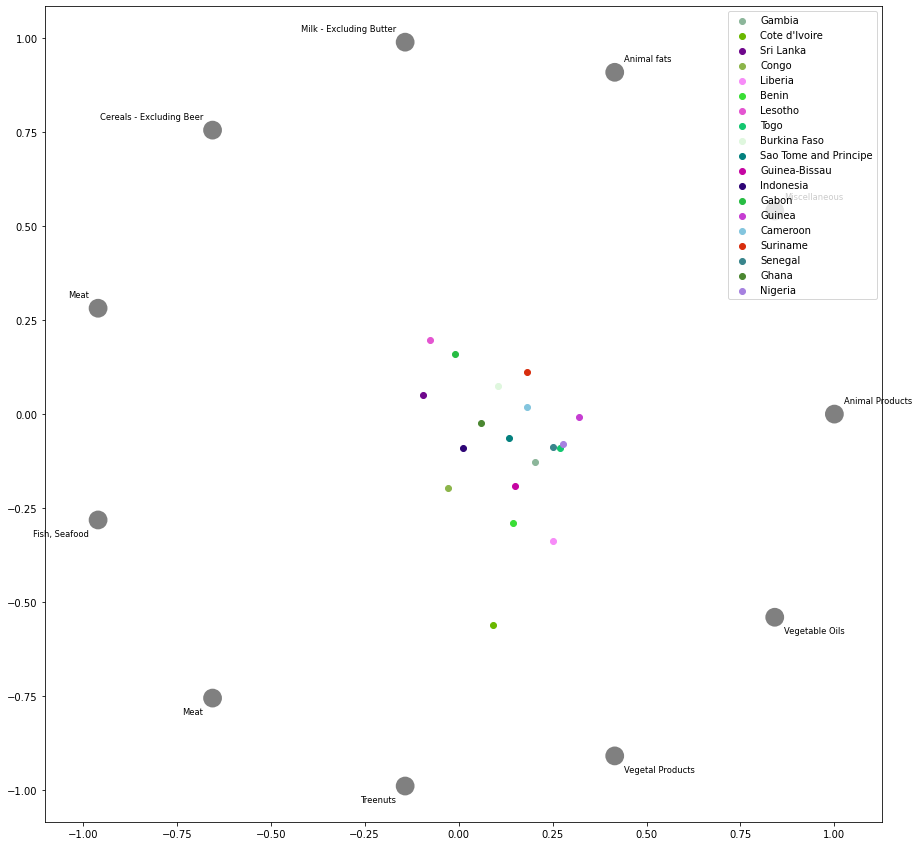

In [180]:

Fat_df_subsection = Fat_df[SAMPLE_COLUMNS].dropna()
Fat_df_subsection = Fat_df_subsection.sort_values(by="Animal fats",ascending = True )[1:20]
#print(Fat_df_subsection.head())
plt.figure(figsize=(15,15))
radviz(Fat_df_subsection,'Country')

### Visualization of muli-variate data for some countries (Protein consumption from different kinds of raw food )

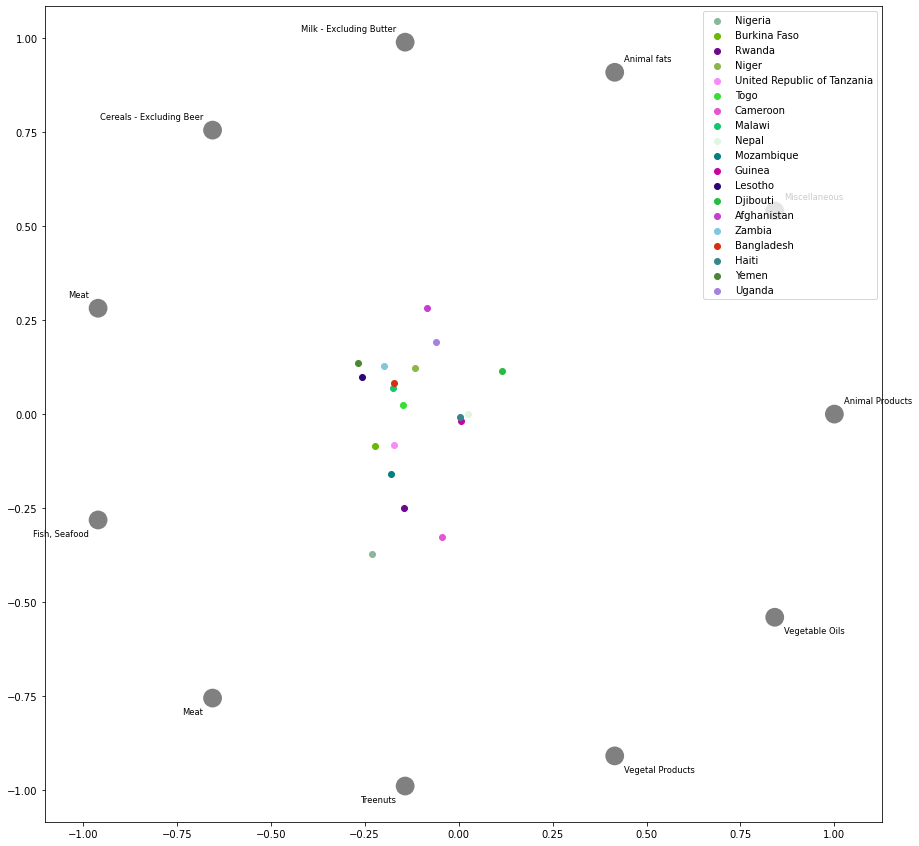

In [181]:
from pandas.plotting import radviz
Protein_df_subsection = Protein_df[SAMPLE_COLUMNS].dropna()
Protein_df_subsection = Protein_df_subsection.sort_values(by="Animal Products",ascending = True )[1:20]
#print(Protein_df_subsection.head())
plt.figure(figsize=(15,15))
radviz(Protein_df_subsection,'Country')

# Visualization of muli-variate data for some countries (Energy consumption from different kinds of raw food )

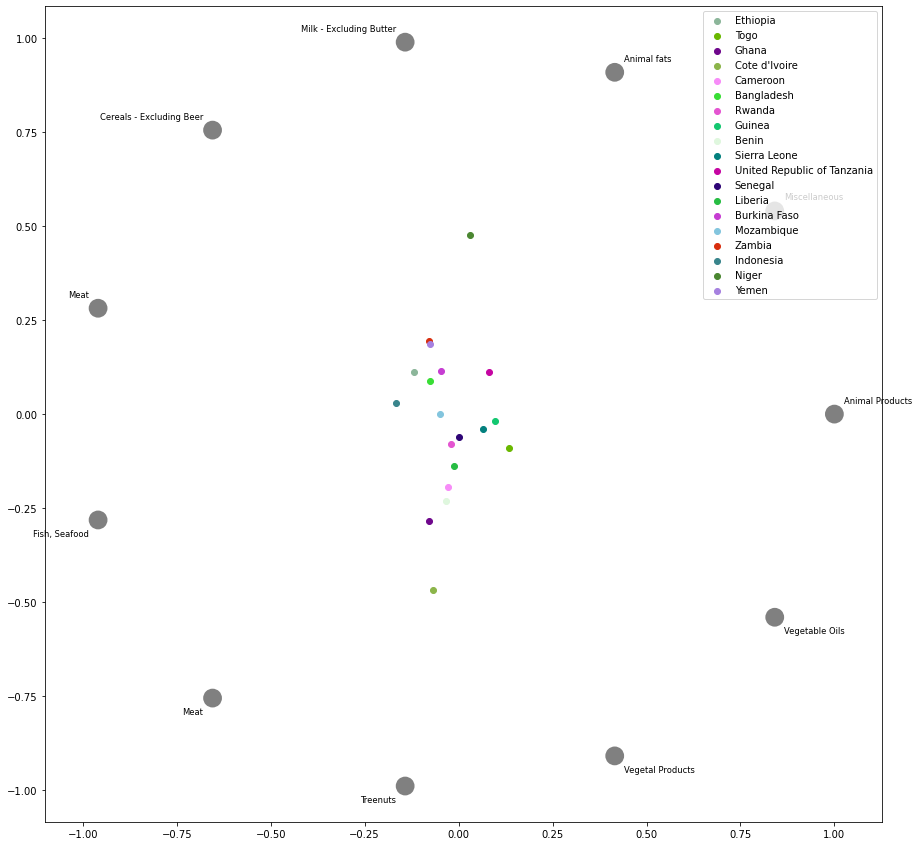

In [182]:
from pandas.plotting import radviz
Kcal_df_subsection = Kcal_df[SAMPLE_COLUMNS].dropna()
Kcal_df_subsection = Kcal_df_subsection.sort_values(by="Animal Products",ascending = True )[1:20]
#print(Protein_df_subsection.head())
plt.figure(figsize=(15,15))
radviz(Kcal_df_subsection,'Country')

# Visualization of muli-variate data for some countries (Total Amount consumption from different kinds of raw food )

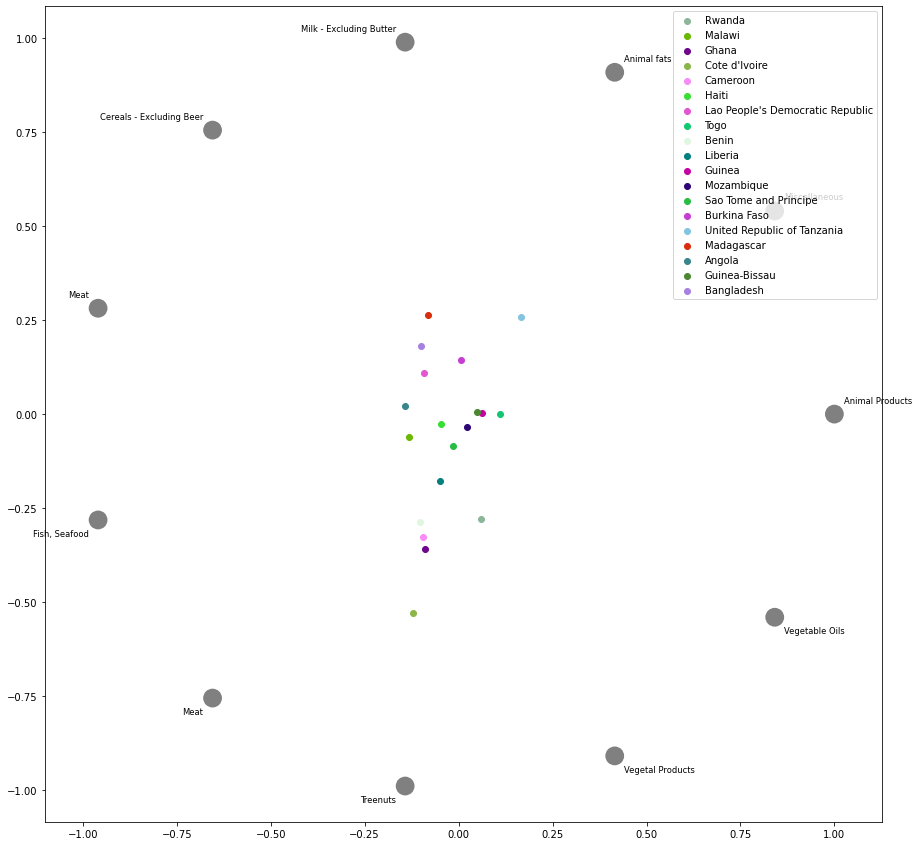

In [183]:
from pandas.plotting import radviz
Amount_df_subsection = Amount_df[SAMPLE_COLUMNS].dropna()
Amount_df_subsection = Amount_df_subsection.sort_values(by="Animal Products",ascending = True )[1:20]
#print(Protein_df_subsection.head())
plt.figure(figsize=(15,15))
radviz(Amount_df_subsection,'Country')

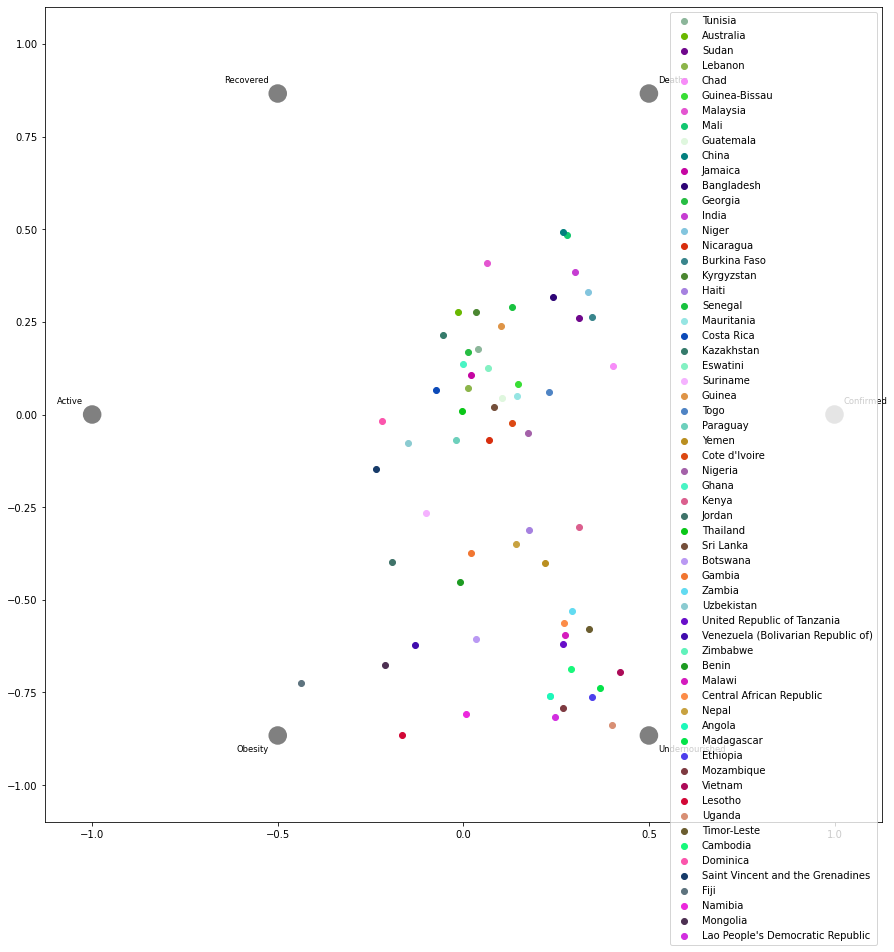

In [184]:
## RADviz FOR COVID CASES

df = Fat_Supply_DF[HEALTH_DATA].sort_values(by="Deaths",ascending = False ).dropna(axis=0)
plt.figure(figsize=(15,15))
radviz(df_death,'Country')


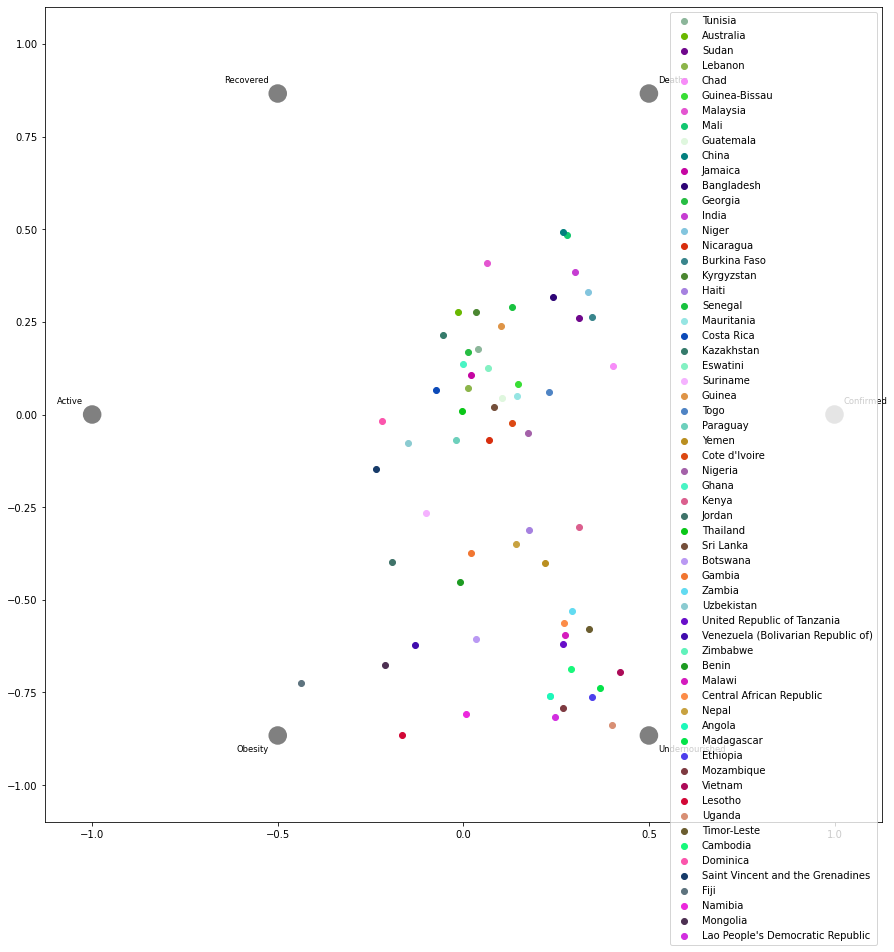

In [185]:
df_death = df[90:152]
plt.figure(figsize=(15,15))
radviz(df_death,'Country')

In [186]:
### Bar chart (Fat consumption from different kids of raw food )

<Figure size 432x288 with 0 Axes>

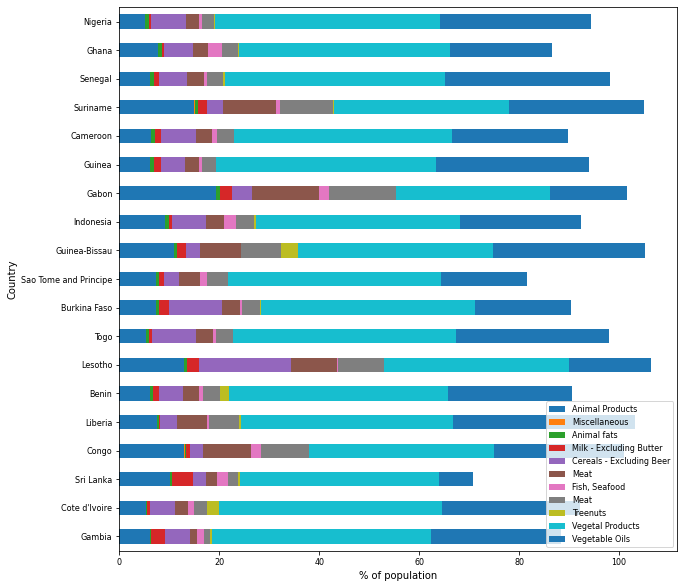

In [187]:
plt.figure();
Fat_df_subsection.plot.barh(stacked=True,figsize=(10,10), x = 'Country',fontsize = 8).legend(fontsize=8)
plt.xlabel('% of population')
plt.show()
#plt.suptitle("Countries that has high infection rate",y=0.05)
#plt.savefig('Visualization1_Plots/Barchart_Infection_Rate.png')

### Bar chart (Protein consumption from different kids of raw food )

<Figure size 432x288 with 0 Axes>

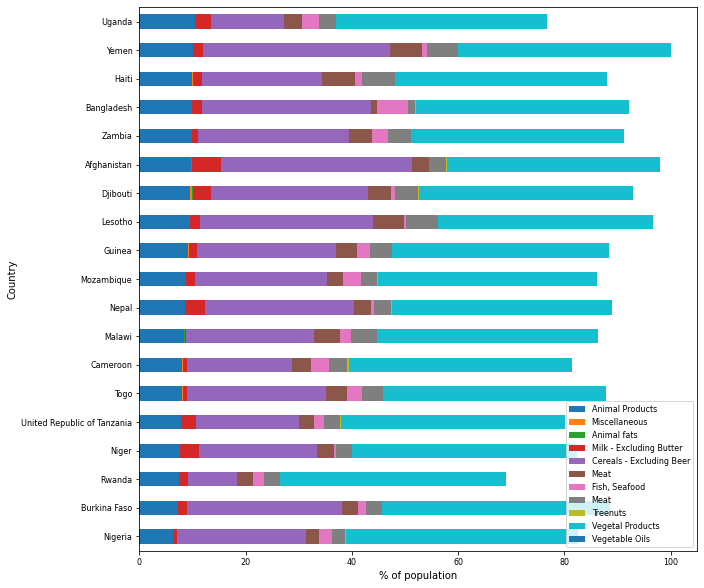

In [188]:
plt.figure();
Protein_df_subsection.plot.barh(stacked=True,figsize=(10,10), x = 'Country',fontsize = 8).legend(fontsize=8)
plt.xlabel('% of population')
plt.show()




### Bar chart (Kcal data consumption from different kids of raw food )

<Figure size 432x288 with 0 Axes>

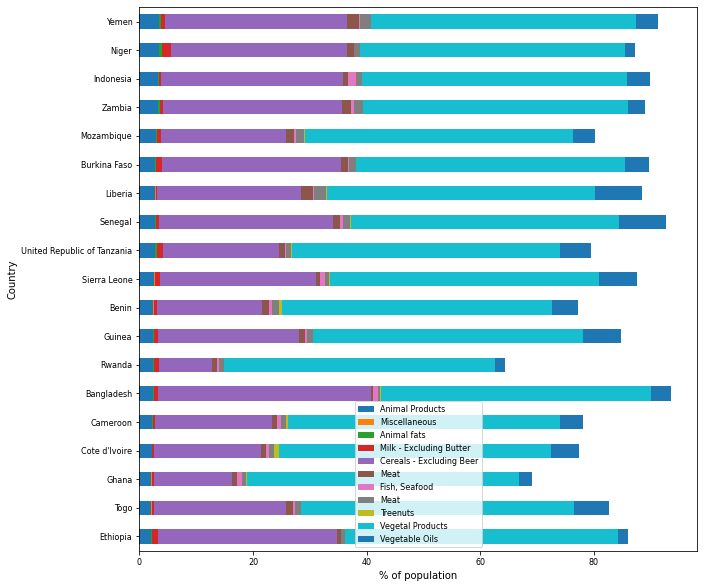

In [189]:
plt.figure();
Kcal_df_subsection.plot.barh(stacked=True,figsize=(10,10), x = 'Country',fontsize = 8).legend(fontsize=8)
plt.xlabel('% of population')
plt.show()

In [190]:
### Bar chart (Amount data consumption from different kids of raw food )

<Figure size 432x288 with 0 Axes>

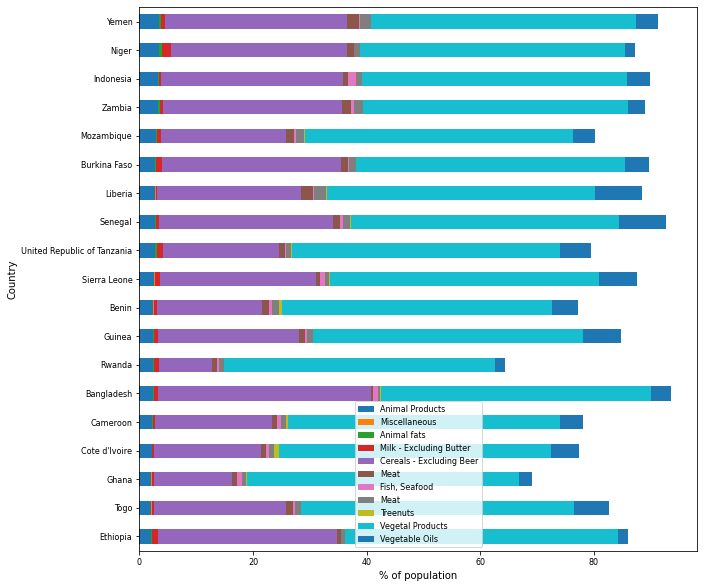

In [191]:
plt.figure();
Kcal_df_subsection.plot.barh(stacked=True,figsize=(10,10), x = 'Country',fontsize = 8).legend(fontsize=8)
plt.xlabel('% of population')
plt.show()

### Sort country by corona death rate. Left pi chart high death rate and right pi chart low death rate due to COVID-19
#### Plot pi-chart of protein and fat fat consumption from different  kinds of food and the general health 

#### Fatty food source 

In [192]:
Fat_Supply_DF = Fat_Supply_DF.sort_values(by=['Deaths'], ascending=False)



In [193]:
Top_country_in_death_fat_table = Fat_Supply_DF.iloc[0].T
Low_country_in_death_fat_table = Fat_Supply_DF.iloc[152].T
array = [Top_country_in_death_fat_table, Low_country_in_death_fat_table]
country_in_death_fat_table = pd.concat(array, axis= 1)
Low_Hi_death_rate = country_in_death_fat_table.rename(columns=country_in_death_fat_table.iloc[0]).drop(['Country'])

array([<matplotlib.axes._subplots.AxesSubplot object at 0x1b4aa2d68>,
      dtype=object)

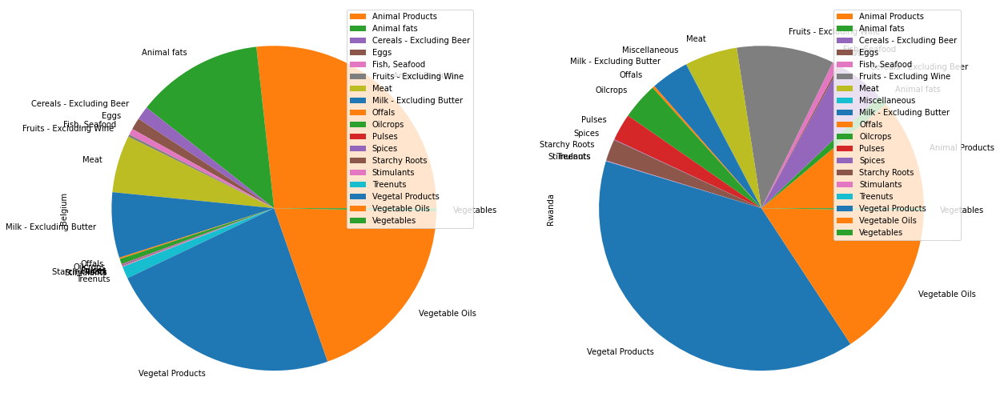

In [194]:
Low_Hi_death_fat_table = Low_Hi_death_rate.drop(HELTH_POP, axis =0)
Low_Hi_death_fat_table.plot.pie( subplots = True,figsize=(20, 11))



### Protein

In [195]:
Protein_Supply_DF = Protein_Supply_DF.sort_values(by=['Deaths'], ascending=False)

In [196]:
Top_country_in_death_pro_table = Protein_Supply_DF.iloc[0].T
Low_country_in_death_pro_table = Protein_Supply_DF.iloc[152].T
array = [Top_country_in_death_pro_table, Low_country_in_death_pro_table]
country_in_death_pro_table = pd.concat(array, axis= 1)
Low_Hi_death_rate = country_in_death_pro_table.rename(columns=country_in_death_pro_table.iloc[0]).drop(['Country'])

array([<matplotlib.axes._subplots.AxesSubplot object at 0x1b4c96c50>,
      dtype=object)

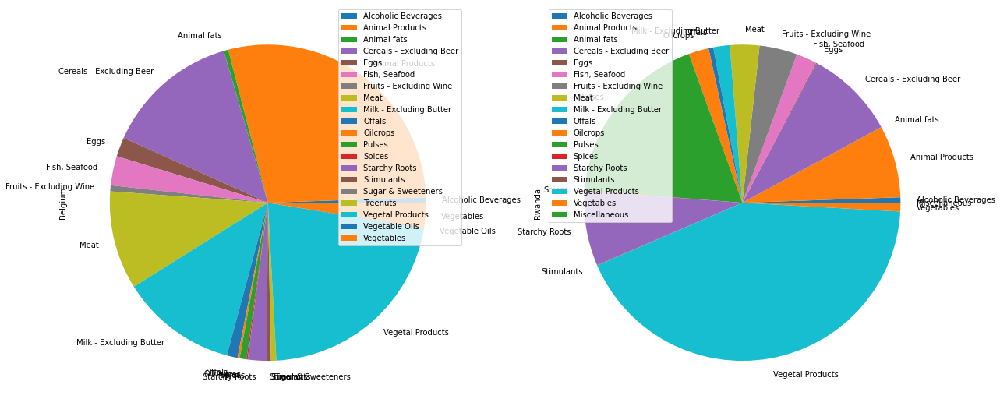

In [197]:
Low_Hi_death_fat_table = Low_Hi_death_rate.drop(HELTH_POP, axis =0)
Low_Hi_death_fat_table.plot.pie( subplots = True,figsize=(20, 11))



## Kcal Data

In [198]:
Kcal_data_DF = Kcal_data_DF.sort_values(by=['Deaths'], ascending=False)

In [199]:
Top_country_in_death_pro_table = Protein_Supply_DF.iloc[0].T
Low_country_in_death_pro_table = Protein_Supply_DF.iloc[152].T
array = [Top_country_in_death_pro_table, Low_country_in_death_pro_table]
country_in_death_pro_table = pd.concat(array, axis= 1)
Low_Hi_death_rate = country_in_death_pro_table.rename(columns=country_in_death_pro_table.iloc[0]).drop(['Country'])

array([<matplotlib.axes._subplots.AxesSubplot object at 0x1b4e2cda0>,
      dtype=object)

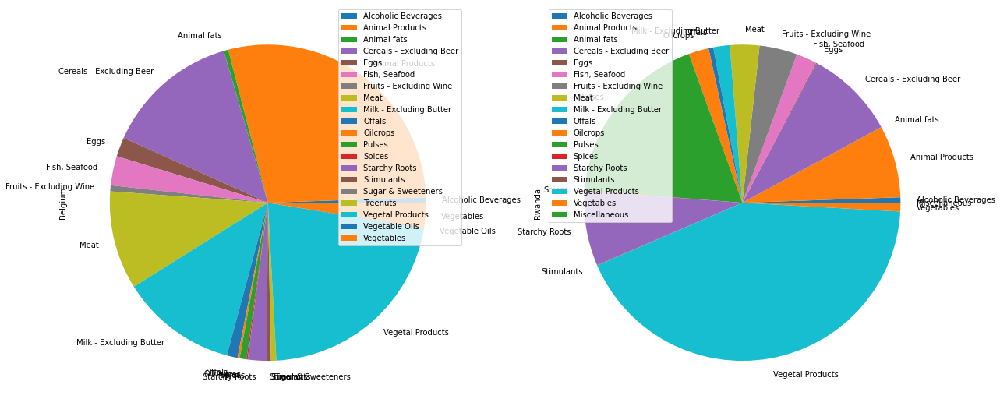

In [200]:
Low_Hi_death_fat_table = Low_Hi_death_rate.drop(HELTH_POP, axis =0)
Low_Hi_death_fat_table.plot.pie( subplots = True,figsize=(20, 11))

## Amount Data

In [201]:
Amount_data_DF = Amount_data_DF.sort_values(by=['Deaths'], ascending=False)

In [202]:
Top_country_in_death_pro_table = Protein_Supply_DF.iloc[0].T
Low_country_in_death_pro_table = Protein_Supply_DF.iloc[152].T
array = [Top_country_in_death_pro_table, Low_country_in_death_pro_table]
country_in_death_pro_table = pd.concat(array, axis= 1)
Low_Hi_death_rate = country_in_death_pro_table.rename(columns=country_in_death_pro_table.iloc[0]).drop(['Country'])


array([<matplotlib.axes._subplots.AxesSubplot object at 0x1b4fd70f0>,
      dtype=object)

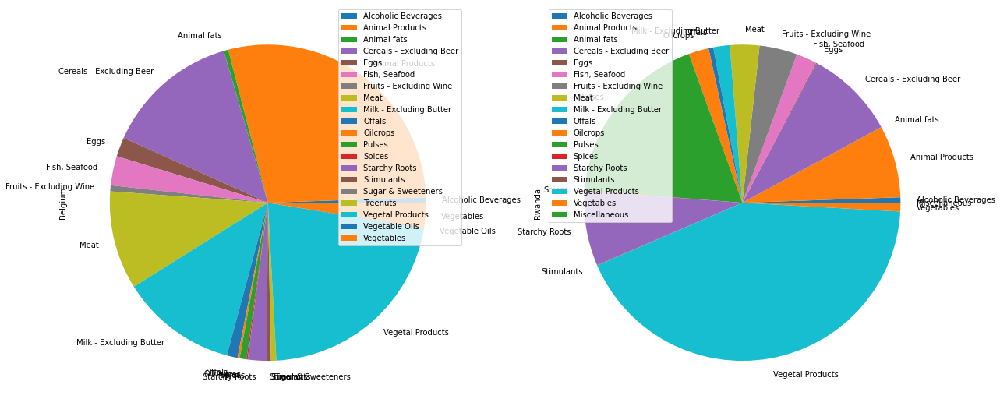

In [203]:
Low_Hi_death_fat_table = Low_Hi_death_rate.drop(HELTH_POP, axis =0)
Low_Hi_death_fat_table.plot.pie( subplots = True,figsize=(20, 11))

## General health vs COVID- 19 death (Left high death and Right high death)

               Belgium Rwanda
Obesity           24.5    4.8
Undernourished     2.5   36.8


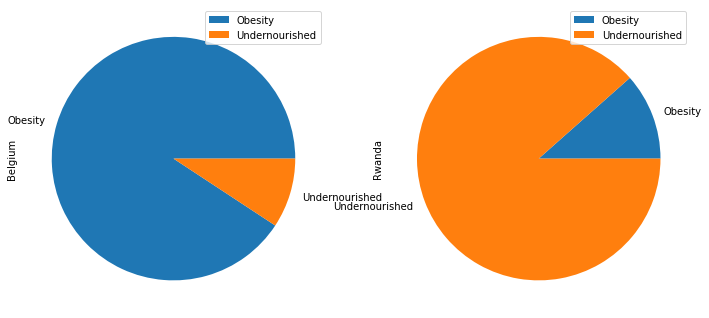

In [204]:
#Top_country_in_death_general_health_table = Fat_Supply_DF.iloc[0][GENERAL_HEALTH]
#Low_country_in_death_fat_general_health_table = Fat_Supply_DF.iloc[152][GENERAL_HEALTH]

Low_Hi_death_rate_general_health = Low_Hi_death_rate.loc[GENERAL_HEALTH] 
Low_Hi_death_rate_general_health.plot.pie( subplots = True,figsize=(12, 12))
print(Low_Hi_death_rate_general_health)

